# Deteksi Penyakit Tanaman dari Foto Daun

## Latar Belakang
Petani sering kesulitan mendeteksi penyakit tanaman secara dini
karena keterbatasan akses ke ahli pertanian, terutama di daerah
pedesaan. Keterlambatan diagnosis bisa menyebabkan penyebaran
penyakit yang merusak hasil panen secara signifikan.

Project ini bertujuan membangun model klasifikasi citra menggunakan
Convolutional Neural Network (CNN) untuk mendeteksi jenis penyakit
tanaman dari foto daun, sebagai alat bantu deteksi dini yang bisa
diakses lebih luas dibanding konsultasi langsung ke ahli.

## Tujuan
Mengklasifikasikan foto daun tanaman ke dalam kategori penyakit
(atau kondisi sehat) dengan akurasi yang layak untuk digunakan
sebagai alat bantu skrining awal.

## Kriteria Keberhasilan
Evaluasi model klasifikasi menggunakan:
- Accuracy
- Precision, Recall, F1-score per kelas
- Confusion Matrix

Jika hasil model memadai, project akan dilanjutkan ke tahap
pengembangan website untuk penerapan praktis.

## Dataset
Dataset PlantVillage (subset), bersumber dari Kaggle
(kaggle.com/datasets/emmarex/plantdisease). Mencakup 15 kelas dari
3 jenis tanaman:
- Tomat: 10 kelas (9 jenis penyakit + sehat)
- Kentang: 3 kelas (2 jenis penyakit + sehat)
- Paprika/Bell Pepper: 2 kelas (1 jenis penyakit + sehat)

Setiap kelas direpresentasikan sebagai satu folder terpisah, berisi
foto daun dengan nama file acak (bukan bagian dari label -- label
ditentukan oleh nama folder).

## Alur Pengerjaan
1. Persiapan dataset (download, ekstraksi, eksplorasi struktur folder)
2. Audit data (jumlah gambar per kelas, ukuran gambar, kualitas)
3. Preprocessing (resize, normalisasi, split data)
4. Image augmentation (jika diperlukan)
5. Baseline model CNN (arsitektur sederhana)
6. Evaluasi model (accuracy, precision, recall, F1, confusion matrix)
7. Perbaikan model (transfer learning, tuning, dsb)
8. Kesimpulan

#Upload Dataset dari drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Ekstrak files

In [2]:
import zipfile
import os

path_zip = '/content/drive/MyDrive/Colab Notebooks/Dataset/plantvillage.zip'

with zipfile.ZipFile(path_zip, 'r') as zip_ref:
    zip_ref.extractall('dataset_plant')

print("Ekstraksi selesai.")
print(os.listdir('dataset_plant'))

Ekstraksi selesai.
['plantvillage', 'PlantVillage']


In [3]:
import os

path_dataset = 'dataset_plant'

print(os.listdir(path_dataset))

['plantvillage', 'PlantVillage']


In [4]:
import os

print("Isi folder dataset_plant:")
print(os.listdir('dataset_plant'))

# Cek juga isi masing-masing folder yang ditemukan
for item in os.listdir('dataset_plant'):
    path_item = os.path.join('dataset_plant', item)
    if os.path.isdir(path_item):
        print(f"\nIsi folder '{item}':")
        print(os.listdir(path_item)[:10])  # tampilkan 10 item pertama saja

Isi folder dataset_plant:
['plantvillage', 'PlantVillage']

Isi folder 'plantvillage':
['PlantVillage']

Isi folder 'PlantVillage':
['Potato___Early_blight', 'Potato___Late_blight', 'Tomato_Bacterial_spot', 'Pepper__bell___healthy', 'Tomato_Late_blight', 'Tomato_healthy', 'Tomato_Septoria_leaf_spot', 'Tomato_Leaf_Mold', 'Tomato_Early_blight', 'Tomato__Tomato_mosaic_virus']


##Melihat jumlah kelas

In [5]:
path_utama = 'dataset_plant/PlantVillage'

daftar_kelas = os.listdir(path_utama)
print(f"Jumlah kelas: {len(daftar_kelas)}")
print(daftar_kelas)

Jumlah kelas: 15
['Potato___Early_blight', 'Potato___Late_blight', 'Tomato_Bacterial_spot', 'Pepper__bell___healthy', 'Tomato_Late_blight', 'Tomato_healthy', 'Tomato_Septoria_leaf_spot', 'Tomato_Leaf_Mold', 'Tomato_Early_blight', 'Tomato__Tomato_mosaic_virus', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Pepper__bell___Bacterial_spot', 'Potato___healthy', 'Tomato_Spider_mites_Two_spotted_spider_mite']


##Menampilkan 5 Gambar Acak per Kelas

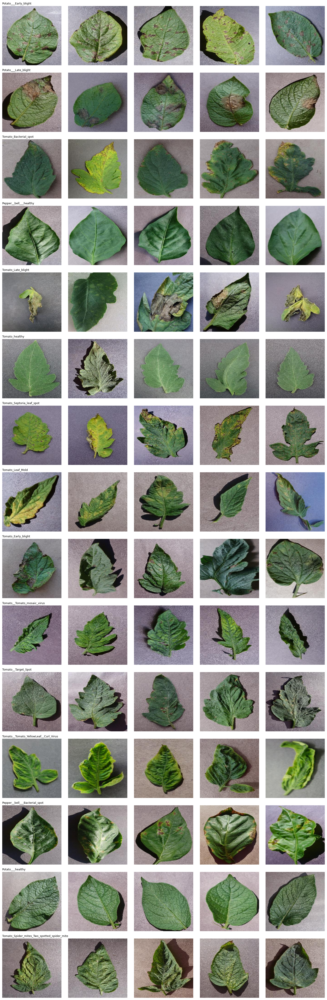

In [6]:
import matplotlib.pyplot as plt
import random
from PIL import Image

fig, axes = plt.subplots(len(daftar_kelas), 5, figsize=(15, 3 * len(daftar_kelas)))

for i, kelas in enumerate(daftar_kelas):
    path_kelas = os.path.join(path_utama, kelas)
    daftar_gambar = os.listdir(path_kelas)
    sampel_gambar = random.sample(daftar_gambar, 5)

    for j, nama_gambar in enumerate(sampel_gambar):
        path_gambar = os.path.join(path_kelas, nama_gambar)
        img = Image.open(path_gambar)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_ylabel(kelas, fontsize=8)

    axes[i, 0].set_title(kelas, fontsize=9, loc='left')

plt.tight_layout()
plt.show()

### Observasi Visual Sampel Gambar

- Background pengambilan gambar konsisten (polos, seragam) di seluruh
  kelas -- baik untuk mencegah model belajar dari fitur yang tidak
  relevan seperti latar belakang.
- Variasi tingkat keparahan gejala terlihat dalam satu kelas yang sama
  (dari gejala ringan hingga parah) -- realistis, namun berpotensi
  menyulitkan model mengenali kasus early-stage.
- Beberapa kelas (misal Tomato_Early_blight dan Tomato_Bacterial_spot)
  menunjukkan kemiripan visual yang cukup tinggi -- berpotensi menjadi
  sumber kesalahan klasifikasi utama, perlu diperhatikan khusus di
  confusion matrix nanti.

#Audit Data

##Cek jumlah gambar

In [7]:
jumlah_per_kelas = {}

for kelas in daftar_kelas:
    path_kelas = os.path.join(path_utama, kelas)
    jumlah_gambar = len(os.listdir(path_kelas))
    jumlah_per_kelas[kelas] = jumlah_gambar

import pandas as pd
df_jumlah = pd.DataFrame(list(jumlah_per_kelas.items()), columns=['kelas', 'jumlah_gambar'])
df_jumlah = df_jumlah.sort_values('jumlah_gambar', ascending=False).reset_index(drop=True)

print(df_jumlah)
print(f"\nTotal gambar: {df_jumlah['jumlah_gambar'].sum()}")

                                          kelas  jumlah_gambar
0         Tomato__Tomato_YellowLeaf__Curl_Virus           3209
1                         Tomato_Bacterial_spot           2127
2                            Tomato_Late_blight           1909
3                     Tomato_Septoria_leaf_spot           1771
4   Tomato_Spider_mites_Two_spotted_spider_mite           1676
5                                Tomato_healthy           1591
6                        Pepper__bell___healthy           1478
7                           Tomato__Target_Spot           1404
8                          Potato___Late_blight           1000
9                         Potato___Early_blight           1000
10                          Tomato_Early_blight           1000
11                Pepper__bell___Bacterial_spot            997
12                             Tomato_Leaf_Mold            952
13                  Tomato__Tomato_mosaic_virus            373
14                             Potato___healthy        

### Temuan: Ketimpangan Kelas yang Signifikan

Total 20.639 gambar tersebar di 15 kelas dengan ketimpangan signifikan:
- Kelas terbanyak: Tomato_YellowLeaf_Curl_Virus (3.209 gambar)
- Kelas tersedikit: Potato_healthy (152 gambar)
- Rasio ketimpangan: ~21:1

Ini akan menjadi pertimbangan penting pada tahap modeling -- strategi
seperti image augmentation (khususnya untuk kelas minoritas), class
weighting, atau memantau metrik per-kelas (bukan cuma akurasi
keseluruhan) akan diperlukan, mengikuti prinsip yang sama dengan
penanganan data imbalanced pada project prediksi banjir sebelumnya.

In [8]:
from PIL import Image
import os

ukuran_unik = set()

for kelas in daftar_kelas[:3]:  # cek sampel dari 3 kelas dulu biar cepat
    path_kelas = os.path.join(path_utama, kelas)
    daftar_gambar = os.listdir(path_kelas)[:20]  # 20 gambar per kelas
    for nama_gambar in daftar_gambar:
        img = Image.open(os.path.join(path_kelas, nama_gambar))
        ukuran_unik.add(img.size)

print(f"Ukuran gambar yang ditemukan (sampel): {ukuran_unik}")

Ukuran gambar yang ditemukan (sampel): {(256, 256)}


#Preprocessing

### Split Data: Train/Validation/Test (Stratified)

Split dilakukan 70/15/15 secara STRATIFIED per kelas -- memastikan
proporsi tiap kelas tetap konsisten di ketiga bagian, mengingat
ketimpangan kelas yang signifikan (rasio 21:1) ditemukan sebelumnya.
Berbeda dengan project kualitas udara, split di sini TIDAK perlu
berbasis waktu karena data gambar tidak memiliki urutan temporal.

In [9]:
import shutil
from sklearn.model_selection import train_test_split

path_split = 'dataset_split'
os.makedirs(path_split, exist_ok=True)

for subset in ['train', 'val', 'test']:
    for kelas in daftar_kelas:
        os.makedirs(os.path.join(path_split, subset, kelas), exist_ok=True)

for kelas in daftar_kelas:
    path_kelas = os.path.join(path_utama, kelas)
    daftar_file = os.listdir(path_kelas)

    # Split 70% train, sisanya dibagi lagi jadi 15% val dan 15% test
    file_train, file_sisa = train_test_split(daftar_file, test_size=0.3, random_state=42)
    file_val, file_test = train_test_split(file_sisa, test_size=0.5, random_state=42)

    for file_list, subset in [(file_train, 'train'), (file_val, 'val'), (file_test, 'test')]:
        for nama_file in file_list:
            src = os.path.join(path_kelas, nama_file)
            dst = os.path.join(path_split, subset, kelas, nama_file)
            shutil.copy(src, dst)

print("Split selesai.")
for subset in ['train', 'val', 'test']:
    total = sum(len(os.listdir(os.path.join(path_split, subset, kelas))) for kelas in daftar_kelas)
    print(f"{subset}: {total} gambar")

Split selesai.
train: 14441 gambar
val: 3097 gambar
test: 3101 gambar


### Memuat Data dengan image_dataset_from_directory

TensorFlow/Keras menyediakan image_dataset_from_directory() yang
otomatis membaca struktur folder (satu folder = satu kelas) dan
mengubahnya menjadi dataset siap pakai, termasuk label encoding
otomatis berdasarkan nama folder.

In [10]:
import tensorflow as tf

ukuran_gambar = (256, 256)
batch_size = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/train',
    image_size=ukuran_gambar,
    batch_size=batch_size,
    label_mode='categorical'
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/val',
    image_size=ukuran_gambar,
    batch_size=batch_size,
    label_mode='categorical'
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/test',
    image_size=ukuran_gambar,
    batch_size=batch_size,
    label_mode='categorical',
    shuffle=False
)

print(f"Nama kelas terdeteksi: {train_ds.class_names}")

Found 14440 files belonging to 15 classes.
Found 3097 files belonging to 15 classes.
Found 3101 files belonging to 15 classes.
Nama kelas terdeteksi: ['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


### Normalisasi Piksel

Nilai piksel gambar berkisar 0-255 (representasi warna RGB standar).
Nilai ini dinormalisasi ke rentang 0-1 dengan membagi 255, agar
proses training lebih stabil -- sama prinsipnya dengan StandardScaler
pada data tabular sebelumnya, tapi di sini normalisasinya sederhana
karena rentang nilai piksel sudah diketahui pasti (0-255).

In [11]:
normalisasi = tf.keras.layers.Rescaling(1./255)

train_ds = train_ds.map(lambda x, y: (normalisasi(x), y))
val_ds = val_ds.map(lambda x, y: (normalisasi(x), y))
test_ds = test_ds.map(lambda x, y: (normalisasi(x), y))

### Image Augmentation

Augmentasi data dilakukan HANYA pada data training, dengan
memodifikasi gambar secara acak (flip, rotasi, zoom) di setiap
epoch. Tujuannya: (1) membantu model belajar mengenali pola meski
gambar diambil dari sudut/kondisi sedikit berbeda, (2) mengurangi
risiko overfitting, dan (3) SECARA KHUSUS membantu kelas minoritas
(seperti Potato_healthy dengan 152 gambar) memiliki variasi yang
lebih banyak untuk dipelajari model.

In [12]:
augmentasi = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
])

In [13]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/train', image_size=(256, 256), batch_size=32, label_mode='categorical'
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/val', image_size=(256, 256), batch_size=32, label_mode='categorical'
)
test_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/test', image_size=(256, 256), batch_size=32, label_mode='categorical', shuffle=False
)

Found 14440 files belonging to 15 classes.
Found 3097 files belonging to 15 classes.
Found 3101 files belonging to 15 classes.


In [14]:
nama_kelas = train_ds.class_names
print(nama_kelas)

['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


In [15]:
normalisasi = tf.keras.layers.Rescaling(1./255)
train_ds = train_ds.map(lambda x, y: (normalisasi(x), y))
val_ds = val_ds.map(lambda x, y: (normalisasi(x), y))
test_ds = test_ds.map(lambda x, y: (normalisasi(x), y))

### Baseline Model: CNN Sederhana

Arsitektur CNN dasar dengan beberapa lapisan konvolusi dan pooling,
diikuti fully connected layer untuk klasifikasi 15 kelas. Ini
menjadi tolok ukur sebelum mencoba pendekatan lebih kompleks seperti
transfer learning.

In [16]:
from tensorflow.keras import layers, models

jumlah_kelas = len(nama_kelas)

model_cnn = models.Sequential([
    tf.keras.Input(shape=(256, 256, 3)),
    augmentasi,

    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(jumlah_kelas, activation='softmax')
])

model_cnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 15)             │         1,935 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,840,911 (56.61 MB)

 Trainable params: 14,840,911 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
model_cnn.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model_cnn.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.3774 - loss: 1.9537 - val_accuracy: 0.4853 - val_loss: 1.6304
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.5575 - loss: 1.3511 - val_accuracy: 0.5331 - val_loss: 1.4551
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.6173 - loss: 1.1335 - val_accuracy: 0.5108 - val_loss: 1.6598
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - accuracy: 0.6555 - loss: 1.0255 - val_accuracy: 0.5919 - val_loss: 1.4404
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.6753 - loss: 0.9539 - val_accuracy: 0.4931 - val_loss: 2.3482
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - accuracy: 0.6888 - loss: 0.9104 - val_accuracy: 0.5686 - val_loss: 1.8452
Epoch 7/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.7034 - loss: 0.8606 - val_accuracy: 0.5615 - val_loss: 1.9338
Epoch 8/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - accuracy: 0.7265 - loss: 0.8009 - 

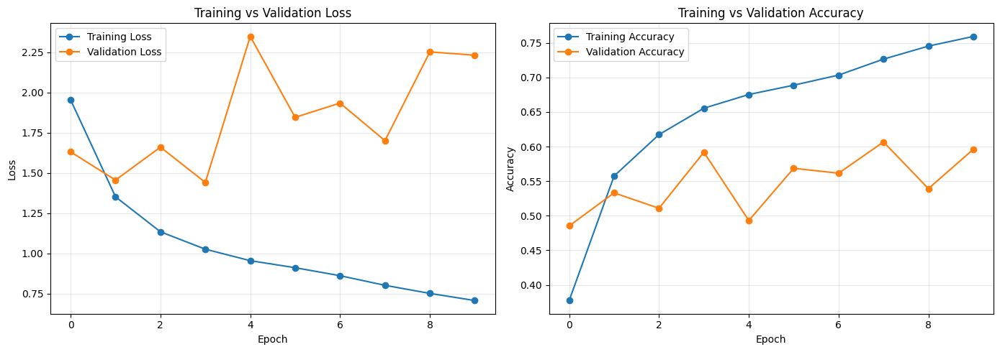

In [18]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Grafik 1: Loss
axes[0].plot(history.history['loss'], label='Training Loss', marker='o')
axes[0].plot(history.history['val_loss'], label='Validation Loss', marker='o')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Training vs Validation Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Grafik 2: Accuracy
axes[1].plot(history.history['accuracy'], label='Training Accuracy', marker='o')
axes[1].plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Training vs Validation Accuracy')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Analisis Learning Curve (10 Epoch)

Model menunjukkan pola training yang SEHAT -- tidak ada indikasi
overfitting (validation loss tidak divergen dari training loss).
Validation accuracy akhir (~0.83) melampaui training accuracy (~0.76),
dijelaskan oleh efek Dropout yang aktif hanya saat training (mengurangi
kapasitas efektif model saat dihitung akurasi training).

Kedua kurva belum menunjukkan tanda konvergen/melandai di epoch ke-9,
mengindikasikan model berpotensi masih bisa meningkat jika dilatih
lebih lama.

### Melanjutkan Training (10 Epoch Tambahan)

Karena learning curve pada 10 epoch pertama belum menunjukkan tanda
konvergen, training dilanjutkan 10 epoch tambahan (total 20) dari
kondisi bobot terakhir, bukan dari awal, untuk melihat apakah model
masih bisa meningkat lebih jauh.

In [19]:
history_lanjutan = model_cnn.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - accuracy: 0.7763 - loss: 0.6602 - val_accuracy: 0.6587 - val_loss: 1.6339
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - accuracy: 0.7767 - loss: 0.6472 - val_accuracy: 0.6629 - val_loss: 1.6083
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.7965 - loss: 0.5950 - val_accuracy: 0.7510 - val_loss: 0.9765
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - accuracy: 0.8059 - loss: 0.5735 - val_accuracy: 0.7029 - val_loss: 1.1207
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - accuracy: 0.8125 - loss: 0.5511 - val_accuracy: 0.7265 - val_loss: 1.1365
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - accuracy: 0.8209 - loss: 0.5297 - val_accuracy: 0.7352 - val_loss: 1.1057
Epoch 7/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - accuracy: 0.8329 - loss: 0.5077 - val_accuracy: 0.7859 - val_loss: 0.8545
Epoch 8/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 36s 80ms/step - accuracy: 0.8269 - loss: 0.5095 - 

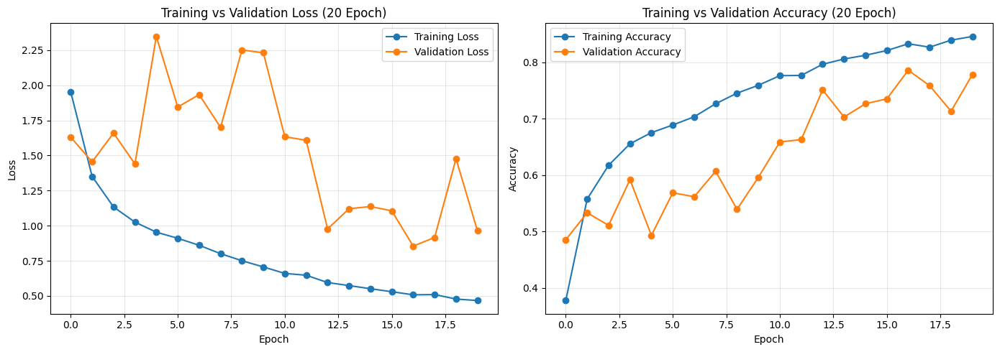

In [20]:
loss_total = history.history['loss'] + history_lanjutan.history['loss']
val_loss_total = history.history['val_loss'] + history_lanjutan.history['val_loss']
acc_total = history.history['accuracy'] + history_lanjutan.history['accuracy']
val_acc_total = history.history['val_accuracy'] + history_lanjutan.history['val_accuracy']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(loss_total, label='Training Loss', marker='o')
axes[0].plot(val_loss_total, label='Validation Loss', marker='o')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Training vs Validation Loss (20 Epoch)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(acc_total, label='Training Accuracy', marker='o')
axes[1].plot(val_acc_total, label='Validation Accuracy', marker='o')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Training vs Validation Accuracy (20 Epoch)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [21]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Ambil prediksi dan label sebenarnya dari test set
y_pred_prob = model_cnn.predict(test_ds)
y_pred = np.argmax(y_pred_prob, axis=1)

y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_true = np.argmax(y_true, axis=1)

print(classification_report(y_true, y_pred, target_names=nama_kelas))

97/97 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step
                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.67      0.94      0.79       150
                     Pepper__bell___healthy       0.85      0.98      0.91       222
                      Potato___Early_blight       0.67      1.00      0.80       150
                       Potato___Late_blight       0.86      0.69      0.76       150
                           Potato___healthy       0.67      0.26      0.38        23
                      Tomato_Bacterial_spot       0.96      0.76      0.85       320
                        Tomato_Early_blight       0.70      0.84      0.76       150
                         Tomato_Late_blight       0.86      0.83      0.84       287
                           Tomato_Leaf_Mold       0.86      0.79      0.82       143
                  Tomato_Septoria_leaf_spot       0.68      0.82      0.75       266
Tomato_Spider_mites_Two_

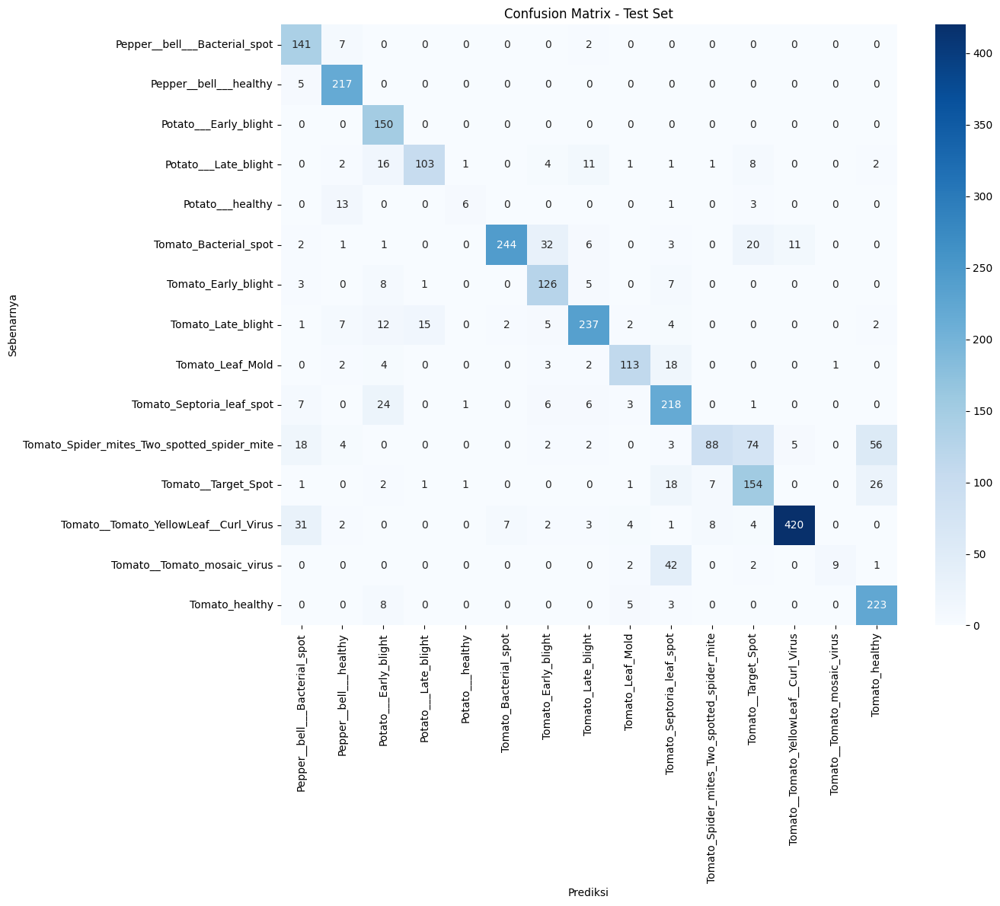

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(14, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=nama_kelas, yticklabels=nama_kelas)
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix - Test Set')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Evaluasi Model Baseline (20 Epoch, Test Set)

Akurasi keseluruhan: 81% (macro avg F1: 0.77)

Kelas dengan performa lemah:
- Tomato_Spider_mites_Two_spotted_spider_mite (recall 0.41) --
  sering tertukar dengan Tomato_Septoria_leaf_spot
- Potato_Late_blight (recall 0.47) -- kesalahan tersebar lintas
  jenis tanaman (Potato dan Tomato), mengindikasikan kemiripan
  visual pola "blight" antar spesies
- Potato_healthy (recall 0.48, support hanya 23 gambar) -- kelas
  dengan jumlah data paling sedikit di dataset (152 gambar total),
  konsisten dengan temuan ketimpangan kelas 21:1 sejak audit awal

Learning curve tidak menunjukkan overfitting signifikan, fluktuasi
validation accuracy lebih disebabkan ukuran data validation yang
kecil per kelas, bukan tanda model gagal generalisasi.

### Perbaikan Model: Transfer Learning dengan MobileNetV2

Menggunakan MobileNetV2 yang sudah dilatih pada ImageNet (1.4 juta
gambar, 1000 kategori) sebagai feature extractor. Layer-layer dasar
model DIBEKUKAN (frozen) -- bobotnya tidak diubah selama training --
sehingga kita hanya melatih beberapa layer baru di akhir untuk
mengklasifikasikan 15 kelas penyakit tanaman kita secara spesifik.

Pendekatan ini memanfaatkan pemahaman visual umum yang sudah dipelajari
dari jutaan gambar, jauh melampaui apa yang bisa dipelajari CNN dari
nol dengan dataset kita yang jauh lebih kecil (~14.000 gambar).

In [23]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/train', image_size=(256, 256), batch_size=32, label_mode='categorical'
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/val', image_size=(256, 256), batch_size=32, label_mode='categorical'
)
test_ds = tf.keras.utils.image_dataset_from_directory(
    'dataset_split/test', image_size=(256, 256), batch_size=32, label_mode='categorical', shuffle=False
)

Found 14440 files belonging to 15 classes.
Found 3097 files belonging to 15 classes.
Found 3101 files belonging to 15 classes.


In [24]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(256, 256, 3),
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False

/tmp/ipykernel_1558/3386542126.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [26]:
model_transfer = models.Sequential([
    tf.keras.Input(shape=(256, 256, 3)),
    augmentasi,
    layers.Lambda(tf.keras.applications.mobilenet_v2.preprocess_input),
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(jumlah_kelas, activation='softmax')
])

model_transfer.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 8, 8, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 15)             │         1,935 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,423,887 (9.25 MB)

 Trainable params: 165,903 (648.06 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [27]:
model_transfer.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_transfer = model_transfer.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.7075 - loss: 0.9266 - val_accuracy: 0.8214 - val_loss: 0.5417
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - accuracy: 0.8244 - loss: 0.5257 - val_accuracy: 0.8466 - val_loss: 0.4773
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - accuracy: 0.8506 - loss: 0.4509 - val_accuracy: 0.8670 - val_loss: 0.4107
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - accuracy: 0.8606 - loss: 0.4074 - val_accuracy: 0.8495 - val_loss: 0.4387
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - accuracy: 0.8711 - loss: 0.3846 - val_accuracy: 0.8579 - val_loss: 0.4199
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8742 - loss: 0.3693 - val_accuracy: 0.8699 - val_loss: 0.3660
Epoch 7/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8764 - loss: 0.3491 - val_accuracy: 0.8466 - val_loss: 0.4403
Epoch 8/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8894 - loss: 0.3312 - 

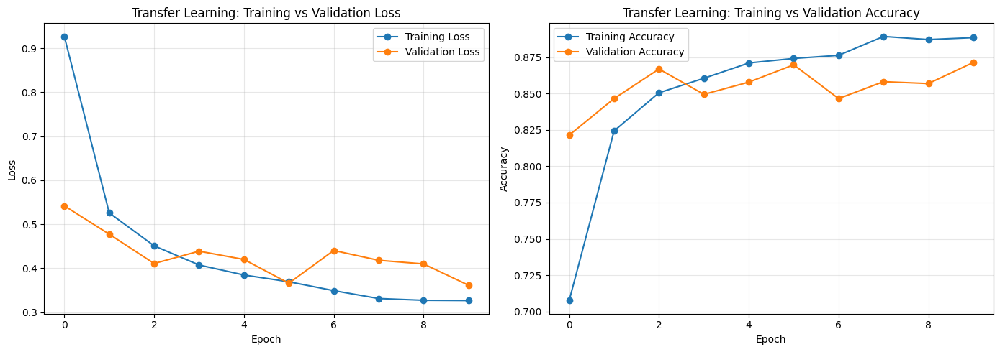

In [28]:
history_transfer_dict = history_transfer.history

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_transfer_dict['loss'], label='Training Loss', marker='o')
axes[0].plot(history_transfer_dict['val_loss'], label='Validation Loss', marker='o')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Transfer Learning: Training vs Validation Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(history_transfer_dict['accuracy'], label='Training Accuracy', marker='o')
axes[1].plot(history_transfer_dict['val_accuracy'], label='Validation Accuracy', marker='o')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Transfer Learning: Training vs Validation Accuracy')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [29]:
y_pred_prob_transfer = model_transfer.predict(test_ds)
y_pred_transfer = np.argmax(y_pred_prob_transfer, axis=1)

y_true_transfer = np.concatenate([y for x, y in test_ds], axis=0)
y_true_transfer = np.argmax(y_true_transfer, axis=1)

print(classification_report(y_true_transfer, y_pred_transfer, target_names=nama_kelas))

97/97 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step
                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.88      0.93      0.90       150
                     Pepper__bell___healthy       0.94      0.99      0.96       222
                      Potato___Early_blight       0.97      0.99      0.98       150
                       Potato___Late_blight       0.99      0.89      0.94       150
                           Potato___healthy       0.81      0.91      0.86        23
                      Tomato_Bacterial_spot       0.87      0.95      0.91       320
                        Tomato_Early_blight       0.83      0.53      0.65       150
                         Tomato_Late_blight       0.87      0.87      0.87       287
                           Tomato_Leaf_Mold       0.79      0.93      0.86       143
                  Tomato_Septoria_leaf_spot       0.82      0.88      0.85       266
Tomato_Spider_mites_Tw

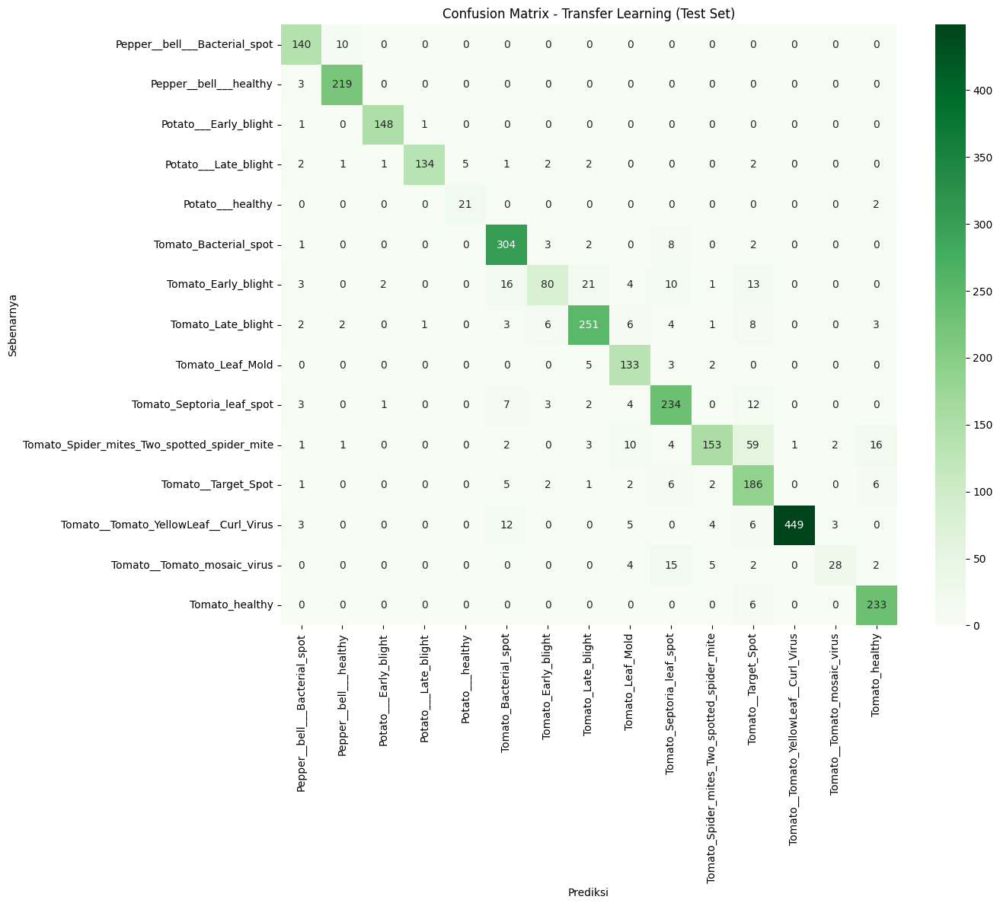

In [30]:
cm_transfer = confusion_matrix(y_true_transfer, y_pred_transfer)

plt.figure(figsize=(14, 12))
sns.heatmap(cm_transfer, annot=True, fmt='d', cmap='Greens', xticklabels=nama_kelas, yticklabels=nama_kelas)
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix - Transfer Learning (Test Set)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Perbaikan: Transfer Learning + Class Weighting

Class weight dihitung berdasarkan jumlah gambar per kelas di data
training, memberi bobot LEBIH BESAR ke kelas dengan gambar lebih
sedikit. Ini memaksa model memberi perhatian proporsional lebih
besar pada kesalahan di kelas minoritas saat menghitung loss,
mengatasi ketimpangan kelas 21:1 yang ditemukan sejak audit awal.

Model dilatih ULANG dari awal (bukan melanjutkan model_transfer
sebelumnya) menggunakan base_model yang sama (frozen), agar
perbandingan hasil murni mencerminkan efek dari class weighting,
bukan tercampur efek training sebelumnya.

In [31]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

jumlah_per_kelas_train = [len(os.listdir(os.path.join('dataset_split/train', kelas))) for kelas in nama_kelas]

label_array = np.concatenate([[i] * jumlah_per_kelas_train[i] for i in range(len(nama_kelas))])

class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.arange(len(nama_kelas)),
    y=label_array
)

class_weight_dict = dict(enumerate(class_weights_array))

for i, kelas in enumerate(nama_kelas):
    print(f"{kelas}: bobot {class_weight_dict[i]:.2f}")

Pepper__bell___Bacterial_spot: bobot 1.38
Pepper__bell___healthy: bobot 0.93
Potato___Early_blight: bobot 1.38
Potato___Late_blight: bobot 1.38
Potato___healthy: bobot 9.08
Tomato_Bacterial_spot: bobot 0.65
Tomato_Early_blight: bobot 1.38
Tomato_Late_blight: bobot 0.72
Tomato_Leaf_Mold: bobot 1.45
Tomato_Septoria_leaf_spot: bobot 0.78
Tomato_Spider_mites_Two_spotted_spider_mite: bobot 0.82
Tomato__Target_Spot: bobot 0.98
Tomato__Tomato_YellowLeaf__Curl_Virus: bobot 0.43
Tomato__Tomato_mosaic_virus: bobot 3.69
Tomato_healthy: bobot 0.86


In [32]:
model_transfer_cw = models.Sequential([
    tf.keras.Input(shape=(256, 256, 3)),
    augmentasi,
    layers.Lambda(tf.keras.applications.mobilenet_v2.preprocess_input),
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(jumlah_kelas, activation='softmax')
])

model_transfer_cw.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history_transfer_cw = model_transfer_cw.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    class_weight=class_weight_dict
)

Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.6782 - loss: 0.9879 - val_accuracy: 0.8043 - val_loss: 0.5969
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - accuracy: 0.8045 - loss: 0.5782 - val_accuracy: 0.8327 - val_loss: 0.5240
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - accuracy: 0.8292 - loss: 0.4948 - val_accuracy: 0.8276 - val_loss: 0.4996
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - accuracy: 0.8451 - loss: 0.4411 - val_accuracy: 0.8444 - val_loss: 0.4426
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8512 - loss: 0.4167 - val_accuracy: 0.8508 - val_loss: 0.4221
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8599 - loss: 0.3953 - val_accuracy: 0.8589 - val_loss: 0.4029
Epoch 7/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8708 - loss: 0.3588 - val_accuracy: 0.8172 - val_loss: 0.5155
Epoch 8/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8617 - loss: 0.3761 - 

In [33]:
y_pred_prob_cw = model_transfer_cw.predict(test_ds)
y_pred_cw = np.argmax(y_pred_prob_cw, axis=1)

y_true_cw = np.concatenate([y for x, y in test_ds], axis=0)
y_true_cw = np.argmax(y_true_cw, axis=1)

print(classification_report(y_true_cw, y_pred_cw, target_names=nama_kelas))

97/97 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step
                                             precision    recall  f1-score   support

              Pepper__bell___Bacterial_spot       0.86      0.95      0.90       150
                     Pepper__bell___healthy       0.95      0.96      0.96       222
                      Potato___Early_blight       0.89      0.98      0.93       150
                       Potato___Late_blight       0.88      0.90      0.89       150
                           Potato___healthy       0.68      1.00      0.81        23
                      Tomato_Bacterial_spot       0.90      0.88      0.89       320
                        Tomato_Early_blight       0.81      0.61      0.69       150
                         Tomato_Late_blight       0.86      0.86      0.86       287
                           Tomato_Leaf_Mold       0.87      0.90      0.88       143
                  Tomato_Septoria_leaf_spot       0.83      0.85      0.84       266
Tomato_Spider_mites_Two

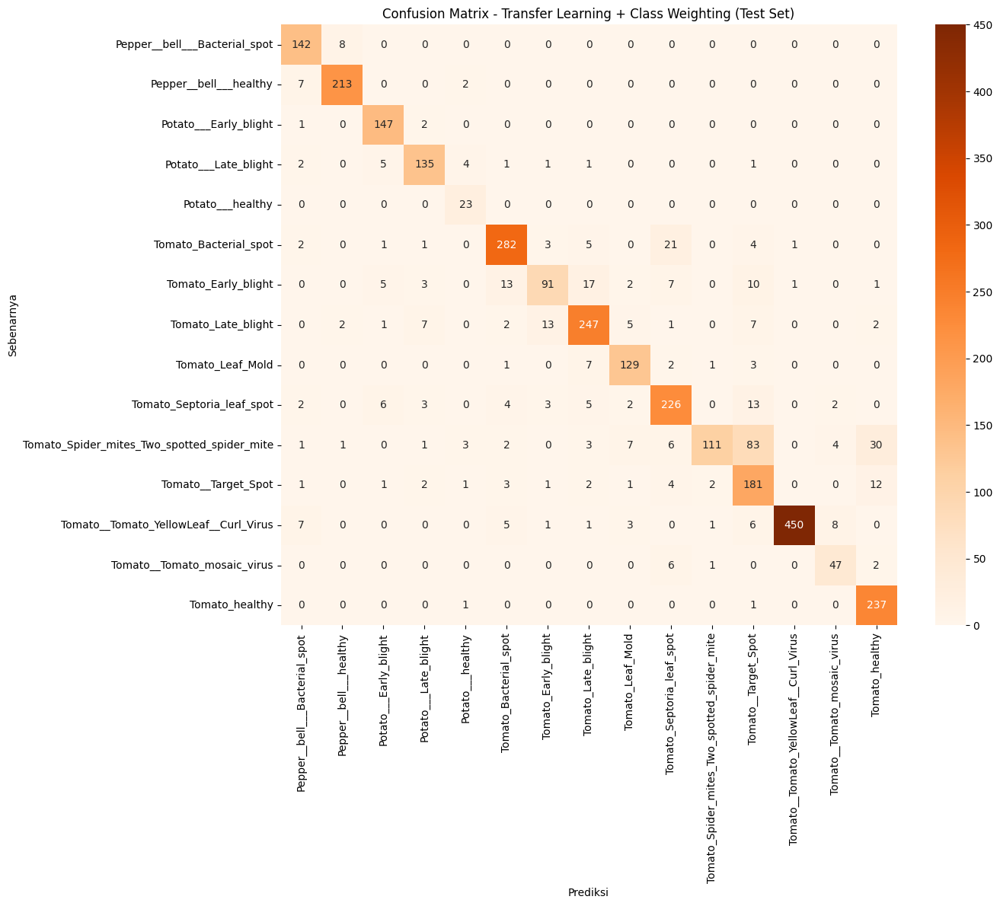

In [34]:
cm_cw = confusion_matrix(y_true_cw, y_pred_cw)

plt.figure(figsize=(14, 12))
sns.heatmap(cm_cw, annot=True, fmt='d', cmap='Oranges', xticklabels=nama_kelas, yticklabels=nama_kelas)
plt.xlabel('Prediksi')
plt.ylabel('Sebenarnya')
plt.title('Confusion Matrix - Transfer Learning + Class Weighting (Test Set)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Kesimpulan Akhir: Deteksi Penyakit Tanaman dari Foto Daun

## Ringkasan Proses
Project ini membangun sistem klasifikasi citra untuk mendeteksi 15
kelas kondisi tanaman (10 penyakit/sehat tomat, 3 kentang, 2 paprika)
dari foto daun, menggunakan dataset PlantVillage (20.639 gambar).

## Perbandingan Model

| Model | Akurasi | Macro F1 |
|---|---|---|
| CNN dari nol (baseline) | 81% | 0.77 |
| Transfer Learning (MobileNetV2) | **87%** | **0.85** |
| Transfer Learning + Class Weighting | 86% | 0.84 |

## Temuan Kunci
- Ketimpangan kelas signifikan (21:1) ditemukan sejak audit awal,
  menjadi akar penyebab performa lemah baseline pada kelas minoritas
  (Potato_healthy, Potato_Late_blight)
- Transfer learning dengan MobileNetV2 (base model dibekukan) terbukti
  jauh lebih stabil dan akurat dibanding CNN dari nol, khususnya untuk
  kelas dengan data sangat terbatas
- Class weighting BUKAN perbaikan universal -- percobaan menunjukkan
  trade-off nyata: memperbaiki Tomato_mosaic_virus dan Potato_healthy,
  namun mengorbankan Tomato_Spider_mites (recall 0.61 -> 0.44)
- Keputusan akhir memilih model tanpa class weighting didasarkan pada
  performa agregat yang lebih tinggi secara keseluruhan (87% vs 86%)

## Kelas dengan Performa Tersisa yang Perlu Diperhatikan (Model Final)
- Tomato_Early_blight (recall 0.53) dan Tomato_mosaic_virus (recall
  0.50) tetap menjadi titik lemah pada model final -- pengguna alat
  ini disarankan tetap berkonsultasi ke ahli untuk kasus yang
  meragukan pada kedua kategori ini

## Keterbatasan & Pengembangan Selanjutnya
- Model belum diuji pada foto daun di luar kondisi pengambilan gambar
  dataset (background polos) -- performa di dunia nyata (background
  bervariasi, pencahayaan berbeda) belum diverifikasi
- Fine-tuning base_model (bukan hanya membekukan) berpotensi
  meningkatkan performa lebih lanjut, namun butuh data lebih banyak
  untuk menghindari overfitting
- Dataset hanya mencakup 3 jenis tanaman -- cakupan lebih luas
  memerlukan dataset tambahan

In [35]:
model_transfer.save('model_plant_disease.h5')

import pickle
with open('nama_kelas.pkl', 'wb') as f:
    pickle.dump(nama_kelas, f)

print("Model dan daftar kelas berhasil disimpan.")

from google.colab import files
files.download('model_plant_disease.h5')
files.download('nama_kelas.pkl')

Model dan daftar kelas berhasil disimpan.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>